<a href="https://colab.research.google.com/github/maryam-v/INSE6220---air-quality-and-pollution-analysis/blob/main/air_quality_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Principal component analysis on the air quality dataset**

**Install Pycaret**

In [ ]:
!pip install pycaret

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 528.7 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 169.7/169.7 kB 5.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of category-encoders to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 486.1/486.1 kB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.8/106.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.8/21.8 MB 22.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.4/85.4 kB 4.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 302.2/302.2 kB 7.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 58.4 MB/s eta 0:00:00
   ━━━

**Import Libraries**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import pandas as pd
plt.rcParams['figure.figsize'] = (7,5)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
print("Pandas version: ", pd.__version__)
print("Seaborn version: ", sns.__version__)

Pandas version:  2.1.4
Seaborn version:  0.13.2


**Air Quality and Pollution Assessment Dataset**

The “Air Quality Dataset” used for Principle Component Analysis (PCA) and classification models is obtained from Kaggle. The data set provided information about air quality attributes to analyze the quality of the air and classify it into three categories: Poor, Moderate, or Good.

The dataset contains 5,000 entries with 5 numerical attributes and one categorical target column representing air quality.

Attributes are listed bellow:

1. Temperature
2. Humidity
3. SO2
4. CO
5. Population_Density
6. Air Quality (Target Label)

All attributes are numerical except for Air Quality, which will be mapped to

*   Poor → 2
*   Moderate → 1
*   Good → 0

The original dataset can be found on below link:
https://www.kaggle.com/datasets/mujtabamatin/air-quality-and-pollution-assessment

In [ ]:
#load data
df = pd.read_csv('https://raw.githubusercontent.com/maryam-v/INSE6220---air-quality-and-pollution-analysis/refs/heads/main/updated_pollution_dataset.csv')
df = df[['Temperature', 'Humidity', 'SO2' ,'CO', 'Population_Density', 'Air Quality']]
# Combine 'hazardous' and 'poor' into 'poor'
df['Air Quality'] = df['Air Quality'].replace({'Hazardous': 'Poor'})
df.head(n=10)

,Temperature,Humidity,SO2,CO,Population_Density,Air Quality
0,29.8,59.1,9.2,1.72,319,Moderate
1,28.3,75.6,9.7,1.64,611,Moderate
2,23.1,74.7,12.6,1.63,619,Moderate
3,27.1,39.1,5.3,1.15,551,Good
4,26.5,70.7,5.6,1.01,303,Good
5,39.4,96.6,17.9,1.82,674,Poor
6,41.7,82.5,12.7,1.80,735,Poor
7,31.0,59.6,13.6,1.38,443,Moderate
8,29.4,93.8,11.8,2.03,486,Poor
9,33.2,80.5,15.3,1.69,535,Poor


In [ ]:
len(df.index)

5000

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 6 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Temperature         5000 non-null   float64
 1   Humidity            5000 non-null   float64
 2   SO2                 5000 non-null   float64
 3   CO                  5000 non-null   float64
 4   Population_Density  5000 non-null   int64  
 5   Air Quality         5000 non-null   object 
dtypes: float64(4), int64(1), object(1)
memory usage: 234.5+ KB


In [ ]:
print("Number of duplicated rows is: ", df.duplicated().sum())

Number of duplicated rows is:  0


In [ ]:
print("Number of rows with NaNs is: ", df.isna().any(axis=1).sum())

Number of rows with NaNs is:  0


**Exploratory Data Analysis**

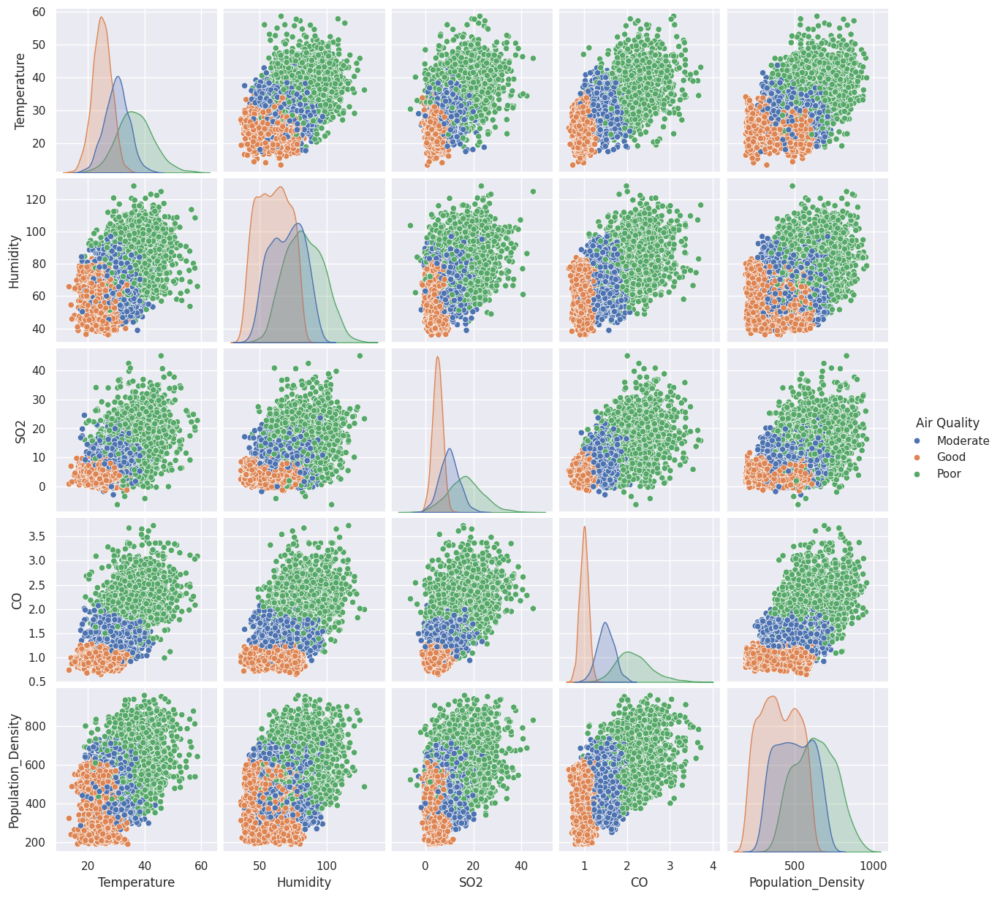

In [ ]:
sns.pairplot(df, hue='Air Quality')
plt.show()

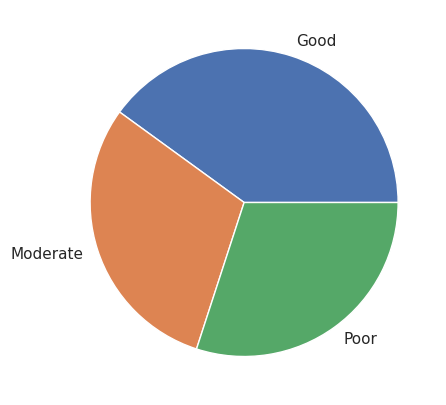

In [ ]:
y =df['Air Quality']
y.value_counts().plot(kind='pie')
plt.ylabel('')
plt.show()

**Data Matrix**

In [ ]:
X = df.drop(columns=['Air Quality'])
X.head(10)

,Temperature,Humidity,SO2,CO,Population_Density
0,29.8,59.1,9.2,1.72,319
1,28.3,75.6,9.7,1.64,611
2,23.1,74.7,12.6,1.63,619
3,27.1,39.1,5.3,1.15,551
4,26.5,70.7,5.6,1.01,303
5,39.4,96.6,17.9,1.82,674
6,41.7,82.5,12.7,1.80,735
7,31.0,59.6,13.6,1.38,443
8,29.4,93.8,11.8,2.03,486
9,33.2,80.5,15.3,1.69,535


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Temperature,5000.0,30.029020,6.720661,13.40,25.10,29.00,34.000,58.60
Humidity,5000.0,70.056120,15.863577,36.00,58.30,69.80,80.300,128.10
SO2,5000.0,10.014820,6.750303,-6.20,5.10,8.00,13.725,44.90
CO,5000.0,1.500354,0.546027,0.65,1.03,1.41,1.840,3.72
Population_Density,5000.0,497.423800,152.754084,188.00,381.00,494.00,600.000,957.00


**Standardize the Data**

In [ ]:
Xs = StandardScaler().fit_transform(X)
Xcols = X.columns
X = pd.DataFrame(Xs)
X.columns = Xcols
X.head(10)

,Temperature,Humidity,SO2,CO,Population_Density
0,-0.034080,-0.690715,-0.120721,0.402303,-1.168163
1,-0.257295,0.349507,-0.046643,0.255775,0.743598
2,-1.031106,0.292768,0.383011,0.237459,0.795975
3,-0.435867,-1.951591,-0.698530,-0.641707,0.350770
4,-0.525153,0.040593,-0.654083,-0.898130,-1.272917
5,1.394493,1.673427,1.168239,0.585462,1.156066
6,1.736756,0.784509,0.397826,0.548830,1.555441
7,0.144491,-0.659193,0.531167,-0.220440,-0.356319
8,-0.093604,1.496904,0.264486,0.970097,-0.074793
9,0.471873,0.658422,0.783033,0.347355,0.246016


In [ ]:
X.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Temperature,5000.0,-4.007461e-16,1.0001,-2.474560,-0.733486,-0.153128,0.590921,4.251641
Humidity,5000.0,4.554579e-16,1.0001,-2.147027,-0.741150,-0.016147,0.645813,3.659306
SO2,5000.0,-7.247536e-17,1.0001,-2.402328,-0.728162,-0.298508,0.549687,5.168459
CO,5000.0,-3.346656e-16,1.0001,-1.557505,-0.861498,-0.165492,0.622094,4.065494
Population_Density,5000.0,-1.875833e-16,1.0001,-2.025836,-0.762241,-0.022416,0.671579,3.008903


**Observations and variables**

In [ ]:
observations = list(df.index)
variables = list(df.columns)

**Box and Whisker Plots**

<ipython-input-15-774acb9c9bc7>:3: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


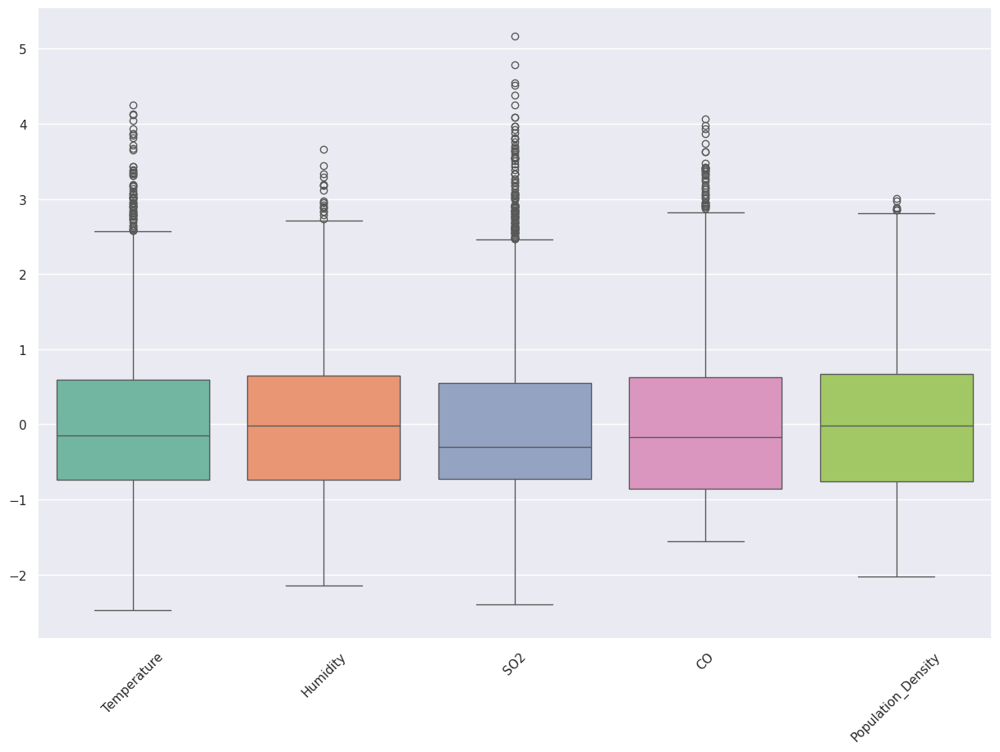

In [ ]:
ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

<ipython-input-16-b50664f0e877>:7: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(ax.get_xticklabels(),rotation=45);


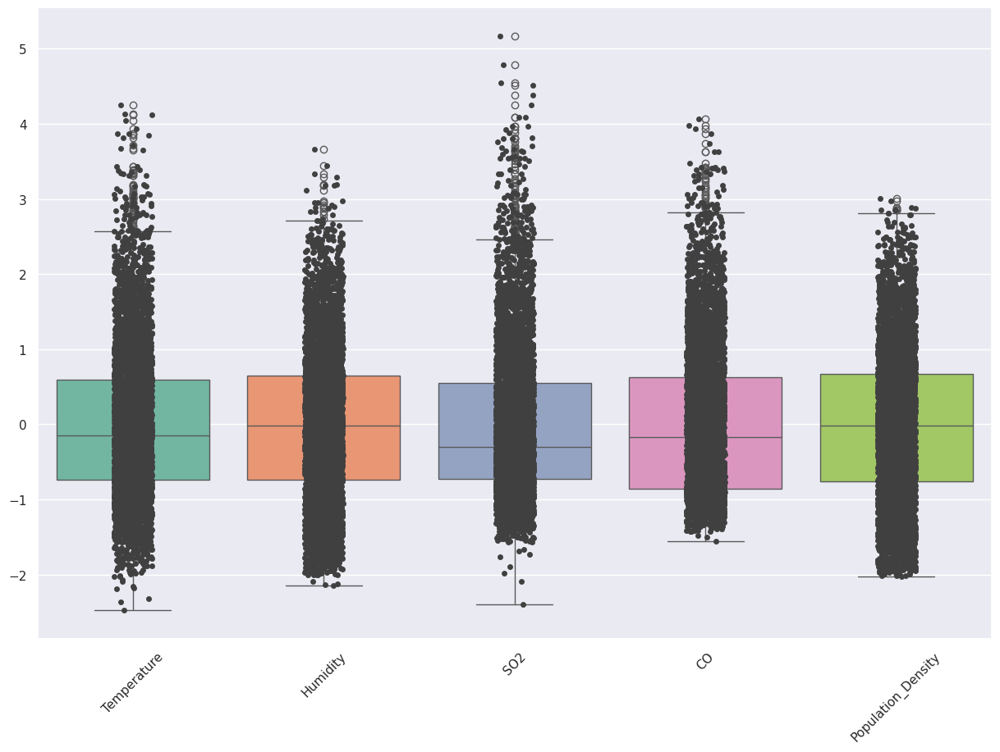

In [ ]:
# Use swarmplot() or stripplot to show the datapoints on top of the boxes:
#plt. figure()

ax = plt.figure(figsize=(15,10))
ax = sns.boxplot(data=X, orient="v", palette="Set2")
ax = sns.stripplot(data=X, color=".25")
ax.set_xticklabels(ax.get_xticklabels(),rotation=45);

**Correlation Matrix**

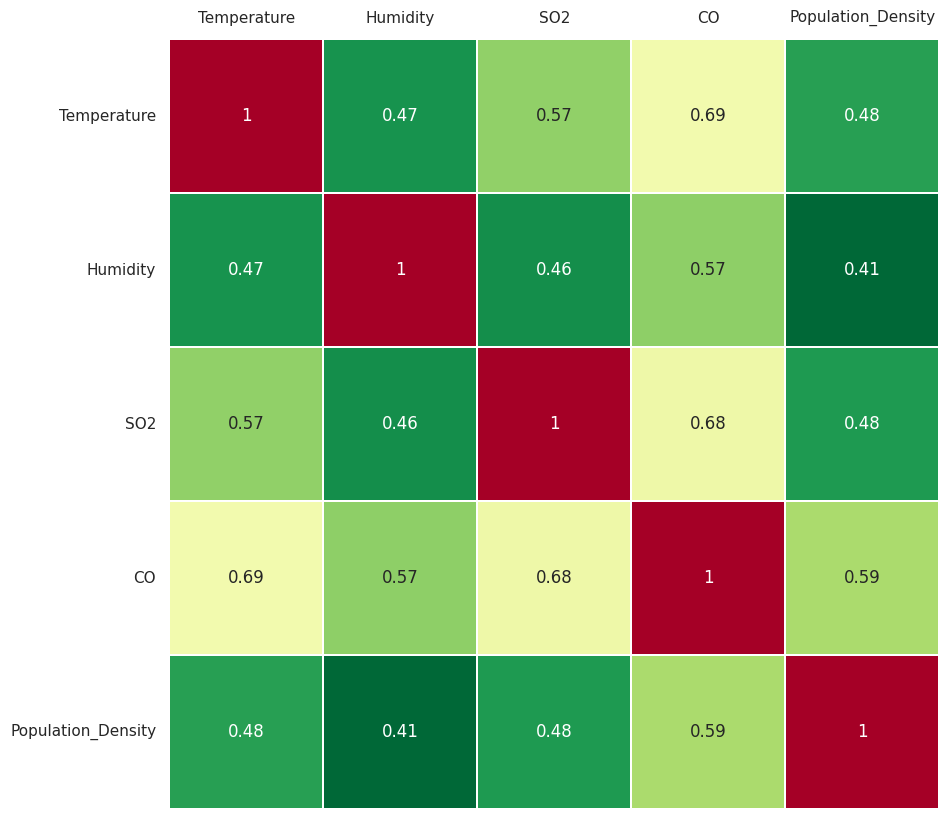

In [ ]:
fig1,ax1 = plt.subplots(figsize=(15,10))
ax = sns.heatmap(X.corr(), cmap='RdYlGn_r', linewidths=0.3, annot=True, cbar=False, square=True)
plt.yticks(rotation=0)
ax.tick_params(labelbottom=False,labeltop=True)
ax.set_xticklabels(ax.get_xticklabels(),rotation=0);

#X.corr().style.background_gradient(cmap='coolwarm').set_precision(2)
#sns.clustermap(X.corr(), annot=True, fmt='.2f')

# **Principal Component Analysis (PCA)**

In [ ]:
df.head(10)

,Temperature,Humidity,SO2,CO,Population_Density,Air Quality
0,29.8,59.1,9.2,1.72,319,Moderate
1,28.3,75.6,9.7,1.64,611,Moderate
2,23.1,74.7,12.6,1.63,619,Moderate
3,27.1,39.1,5.3,1.15,551,Good
4,26.5,70.7,5.6,1.01,303,Good
5,39.4,96.6,17.9,1.82,674,Poor
6,41.7,82.5,12.7,1.80,735,Poor
7,31.0,59.6,13.6,1.38,443,Moderate
8,29.4,93.8,11.8,2.03,486,Poor
9,33.2,80.5,15.3,1.69,535,Poor


In [ ]:
from sklearn.preprocessing import LabelEncoder
# Initialize LabelEncoder
le = LabelEncoder()
y = le.fit_transform(y)
y[:10]

array([1, 1, 1, 0, 0, 2, 2, 1, 2, 2])

Text(0, 0.5, '$Z_2$')

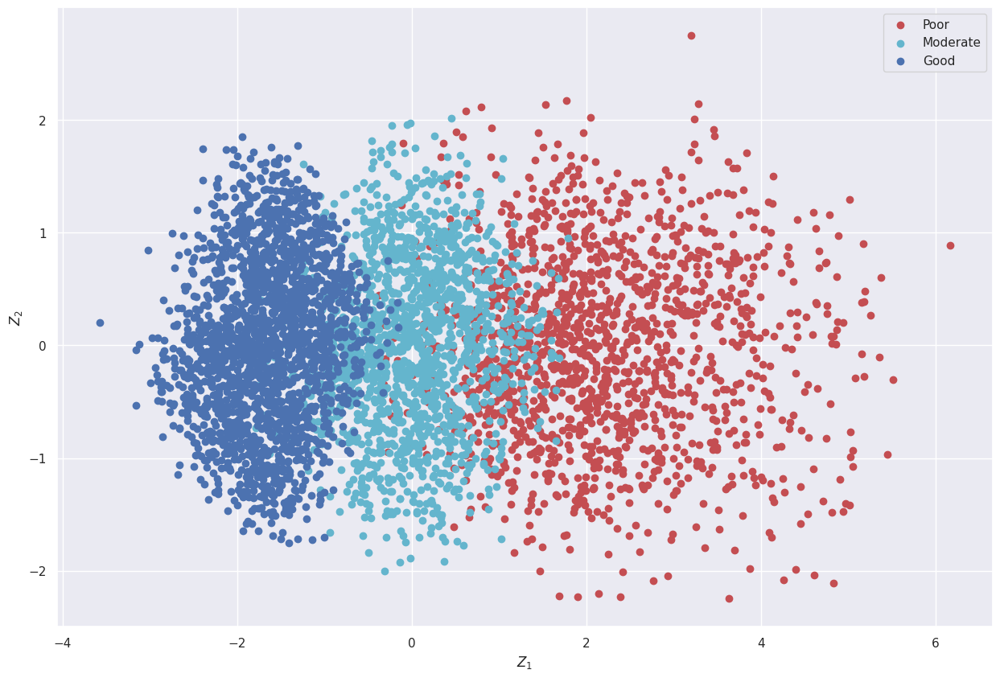

In [ ]:
pca = PCA()
Z = pca.fit_transform(X)


# poor 2 moderate 1 good 0

idx_poor= np.where(y == 2)
idx_moderate= np.where(y == 1)
idx_good = np.where(y == 0)


plt. figure(figsize=(15,10))
plt.scatter(Z[idx_poor,0], Z[idx_poor,1], c='r', label='Poor')
plt.scatter(Z[idx_moderate,0], Z[idx_moderate,1], c='c', label='Moderate')
plt.scatter(Z[idx_good,0], Z[idx_good,1], c='b', label='Good')


plt.legend()
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')

**Eigenvectors**

array([[ 0.45554282, -0.10117106,  0.39123718, -0.71808898, -0.33693744],
       [ 0.40352811,  0.8384818 , -0.33586996,  0.0225317 , -0.14421175],
       [ 0.45245042, -0.11308124,  0.44482936,  0.69493986, -0.31888349],
       [ 0.5035641 , -0.05055595,  0.11061394, -0.01444647,  0.8552328 ],
       [ 0.41395364, -0.5209313 , -0.72388966,  0.0262759 , -0.18046138]])

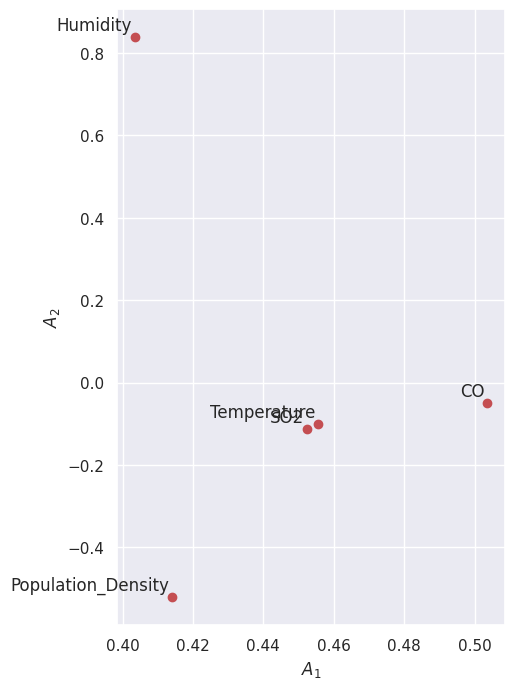

In [ ]:
A = pca.components_.T
plt. figure(figsize=(5,8))

plt.scatter(A[:,0],A[:,1],c='r')
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables, A[:, 0], A[:, 1]):
  plt.annotate(label, xy=(x, y), xytext=(-2, 2), textcoords='offset points', ha='right', va='bottom')
A

/usr/local/lib/python3.11/dist-packages/matplotlib/collections.py:963: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


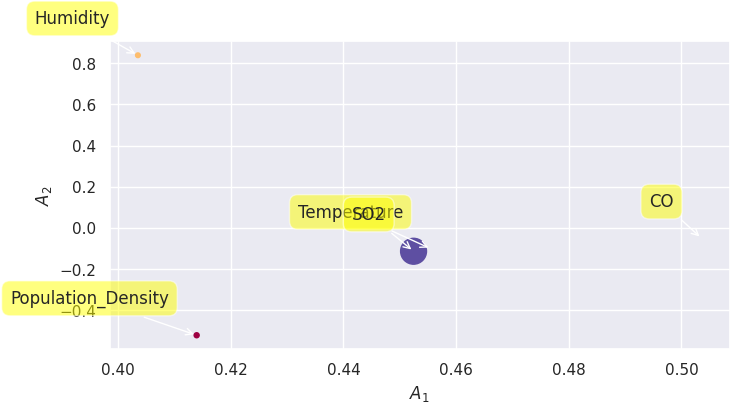

In [ ]:
plt. figure(figsize=(8,4))
plt.scatter(A[:, 0],A[:, 1], marker='o', c=A[:, 2], s=A[:, 3]*500, cmap=plt.get_cmap('Spectral'))
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for label, x, y in zip(variables,A[:, 0],A[:, 1]):
  plt.annotate(label,xy=(x, y), xytext=(-20, 20),
      textcoords='offset points', ha='right', va='bottom',
      bbox=dict(boxstyle='round,pad=0.5', fc='yellow', alpha=0.5),
      arrowprops=dict(arrowstyle = '->', connectionstyle='arc3,rad=0'))

**Scree plot**

array([3.17326538, 0.59186819, 0.54805106, 0.43184198, 0.25597359])

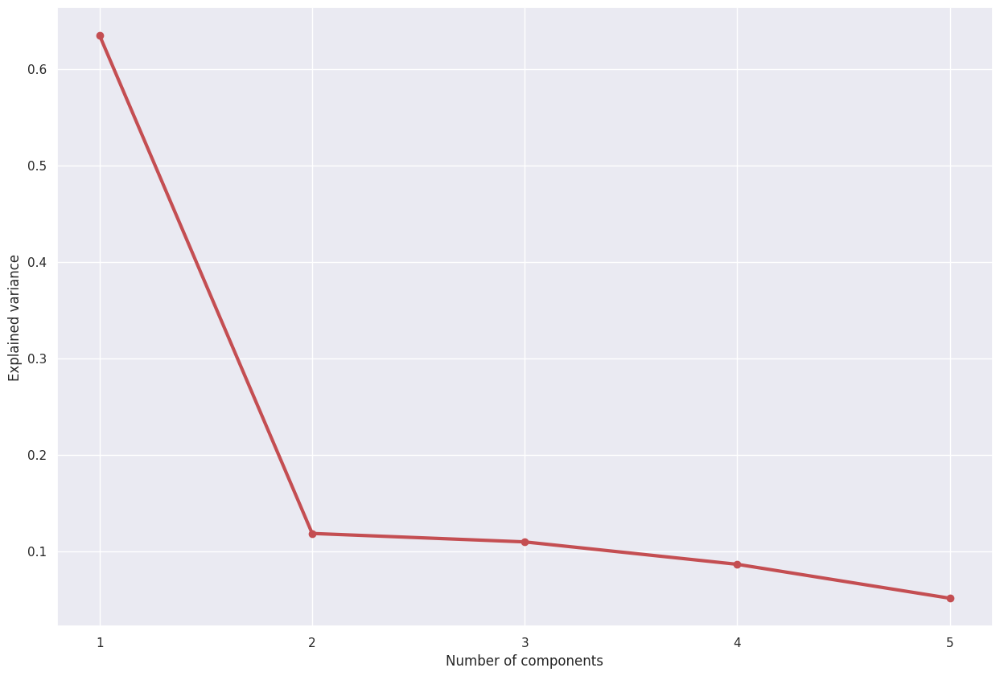

In [ ]:
#Eigenvalues
Lambda = pca.explained_variance_

#Scree plot
x = np.arange(len(Lambda)) + 1
plt. figure(figsize=(15,10))
plt.plot(x,Lambda/sum(Lambda), 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
Lambda

In [ ]:
Lambda

array([3.17326538, 0.59186819, 0.54805106, 0.43184198, 0.25597359])

In [ ]:
Lambda/sum(Lambda)

array([0.63452615, 0.11834996, 0.10958829, 0.08635112, 0.05118448])

**Explained Variance**

Text(0, 0.5, 'Cumulative explained variance')

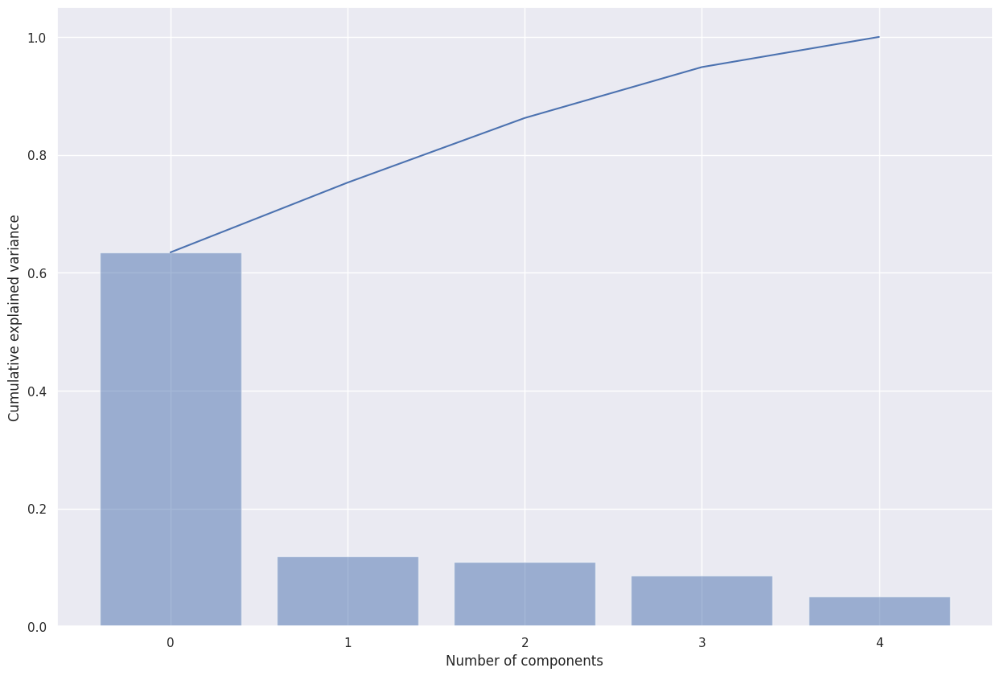

In [ ]:
ell = pca.explained_variance_ratio_
ind = np.arange(len(ell))
plt. figure(figsize=(15,10))
plt.bar(ind, ell, align='center', alpha=0.5)
plt.plot(np.cumsum(ell))
plt.xlabel('Number of components')
plt.ylabel('Cumulative explained variance')

**Biplot**

array([ 0.02614075, -0.07593353, -0.12016579, ...,  0.92165554,
       -0.28164711,  0.63114181])

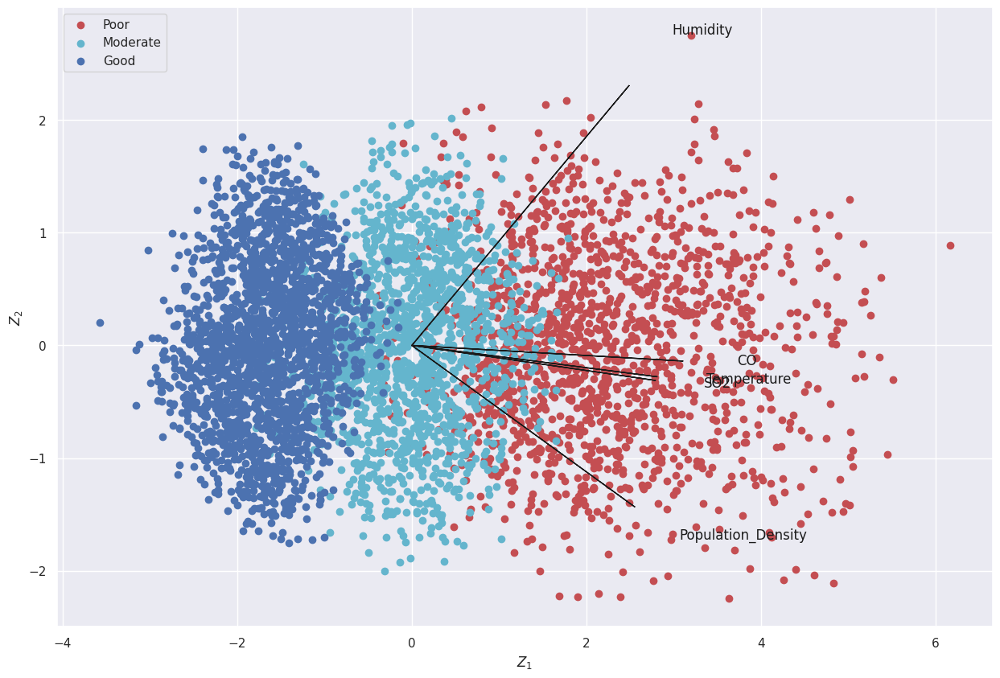

In [ ]:
# 0,1 denote PC1 and PC2; change values for other PCs
A1 = A[:,0]
A2 = A[:,1]
Z1 = Z[:,0]
Z2 = Z[:,1]

plt. figure(figsize=(15,10))
plt.xlabel('$Z_1$')
plt.ylabel('$Z_2$')
plt.scatter(Z[idx_poor,0], Z[idx_poor,1], c='r', label='Poor')
plt.scatter(Z[idx_moderate,0], Z[idx_moderate,1], c='c', label='Moderate')
plt.scatter(Z[idx_good,0], Z[idx_good,1], c='b', label='Good')
for i in range(len(A1)):
# arrows project features as vectors onto PC axes
  plt.arrow(0, 0, A1[i]*max(Z1), A2[i]*max(Z2), color='k', width=0.0005, head_width=0.0025)
  plt.text(A1[i]*max(Z1)*1.2, A2[i]*max(Z2)*1.2,variables[i], color='k')



plt.legend(loc='upper left')
Z1
Z2

# **Using PCA Library**

In [ ]:
!pip install pca

In [ ]:
from pca import pca
# Initialize and keep all PCs
model = pca(n_components=0.85)
# Fit transform
out = model.fit_transform(X)

[pca] >Extracting column labels from dataframe.
[pca] >Extracting row labels from dataframe.
[pca] >The PCA reduction is performed to capture [85.0%] explained variance using the [5] columns of the input data.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Compute explained variance.
[pca] >Number of components is [3] that covers the [85.00%] explained variance.
[pca] >The PCA reduction is performed on the [5] columns of the input dataframe.
[pca] >Fit using PCA.
[pca] >Compute loadings and PCs.
[pca] >Outlier detection using Hotelling T2 test with alpha=[0.05] and n_components=[3]
[pca] >Multiple test correction applied for Hotelling T2 test: [fdr_bh]
[pca] >Outlier detection using SPE/DmodX with n_std=[3]


**Principal Components**

In [ ]:
out['PC']

,PC1,PC2,PC3,PC4,PC5
0,-0.629848,0.026141,1.055078,-0.111490,0.704459
1,0.439338,-0.075934,-0.748791,0.176066,0.135719
2,0.270793,-0.120166,-0.881296,1.030676,0.242502
3,-1.480066,-1.663571,-0.150674,-0.197931,0.038943
4,-1.497984,0.869639,0.312057,-0.097000,-0.158732
...,...,...,...,...,...
4995,3.158384,-1.177218,0.418900,0.520986,-0.668998
4996,1.214755,0.709610,-1.623678,0.360454,-0.372305
4997,-0.422567,0.921656,0.028724,0.200949,0.580625
4998,-2.520410,-0.281647,1.075204,-0.003323,0.021102


**Scatter plot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '5 Principal Components explain [99.99%] of the variance'}, xlabel='PC1 (63.4% expl.var)', ylabel='PC2 (11.8% expl.var)'>)

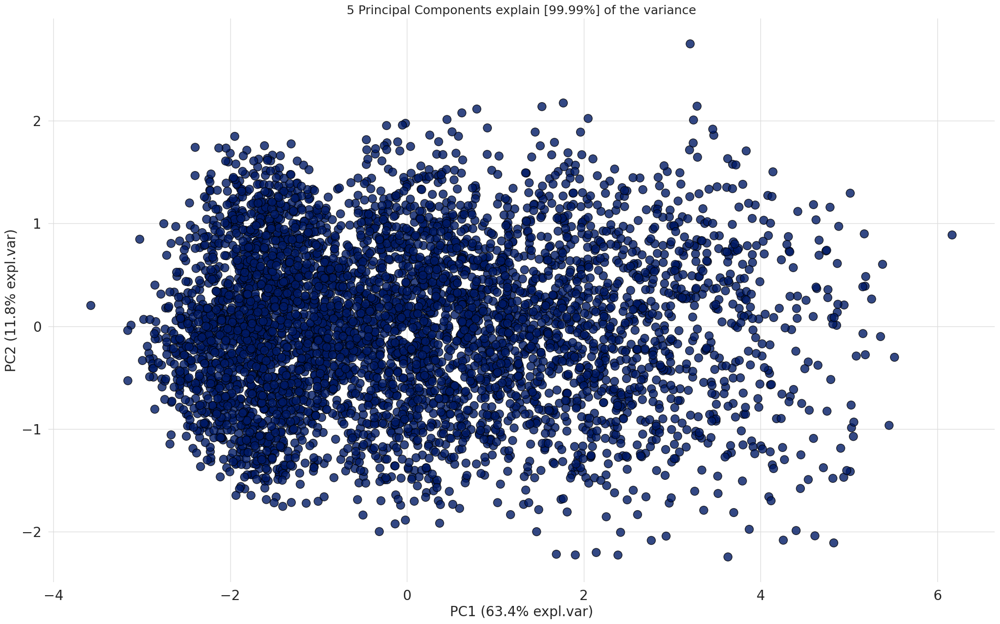

In [ ]:
model.scatter(label=True, legend=False)

**Eigenvectors**

In [ ]:
A = out['loadings'].T
A

,PC1,PC2,PC3,PC4,PC5
Temperature,0.455543,-0.101171,0.391237,-0.718089,-0.336937
Humidity,0.403528,0.838482,-0.335870,0.022532,-0.144212
SO2,0.452450,-0.113081,0.444829,0.694940,-0.318883
CO,0.503564,-0.050556,0.110614,-0.014446,0.855233
Population_Density,0.413954,-0.520931,-0.723890,0.026276,-0.180461


<ipython-input-33-da59a7d9feff>:5: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],


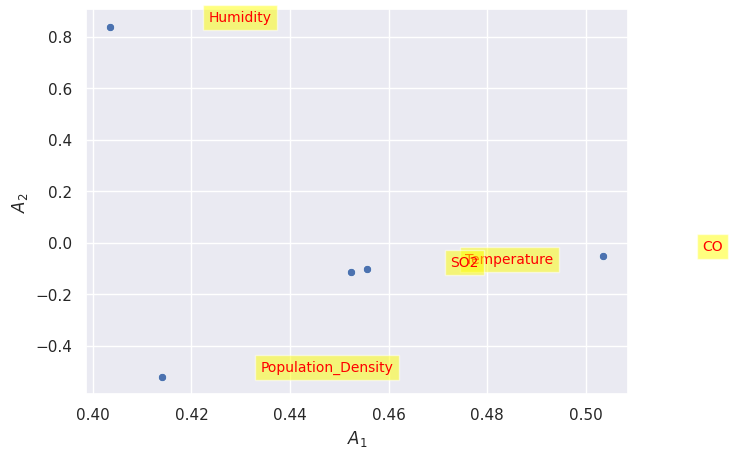

In [ ]:
sns.scatterplot(data=A, x="PC1", y="PC2")
plt.xlabel('$A_1$')
plt.ylabel('$A_2$')
for i in range(A.shape[0]):
 plt.text(x=A.PC1[i]+0.02,y=A.PC2[i]+0.02, s=variables[i],
          fontdict=dict(color='red',size=10),
          bbox=dict(facecolor='yellow',alpha=0.5))

**Scree Plot**

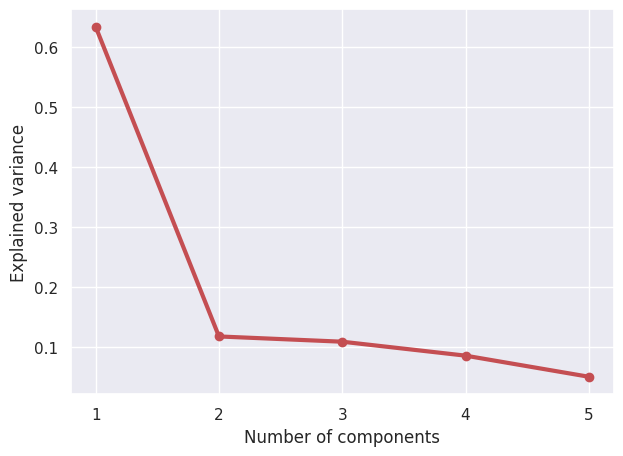

In [ ]:
VR = out['variance_ratio']
x = np.arange(len(VR)) + 1
plt.plot(x, VR, 'ro-', lw=3)
plt.xticks(x, [""+str(i) for i in x], rotation=0)
plt.xlabel('Number of components')
plt.ylabel('Explained variance')
plt.show()

**Explained Variance Plot**

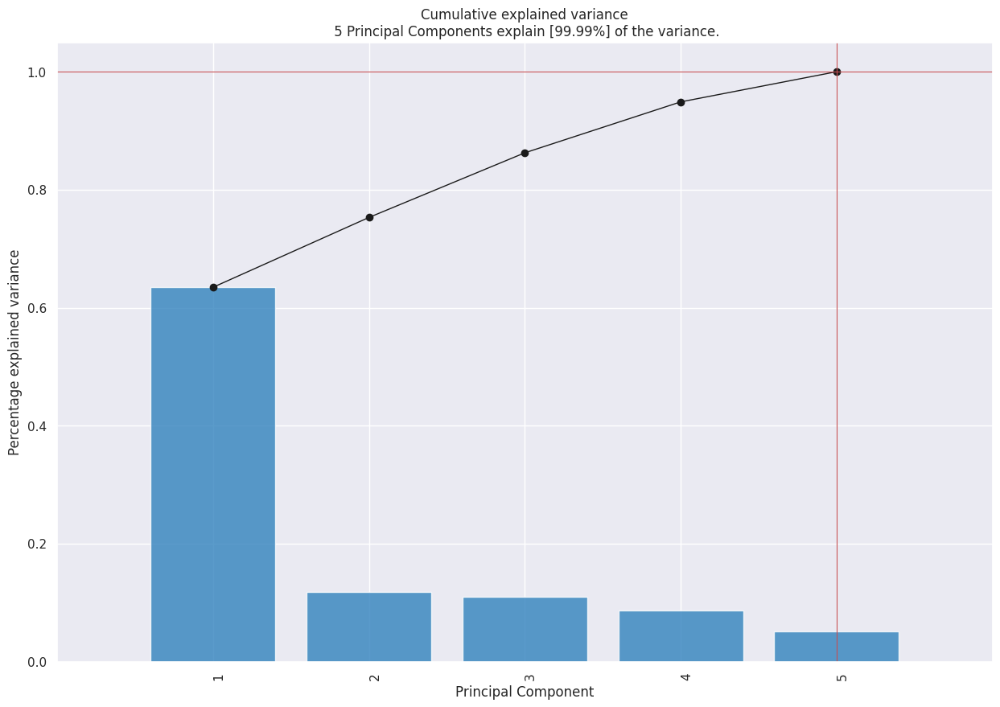

In [ ]:
model.plot();

**Biplot**

[scatterd] >INFO> Create scatterplot


[pca]> [WARNING]: De parameter <label> is deprecated and will not be supported in future version.
[pca] >Plot PC1 vs PC2 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 2500x1500 with 1 Axes>,
 <Axes: title={'center': '5 Principal Components explain [99.99%] of the variance'}, xlabel='PC1 (63.4% expl.var)', ylabel='PC2 (11.8% expl.var)'>)

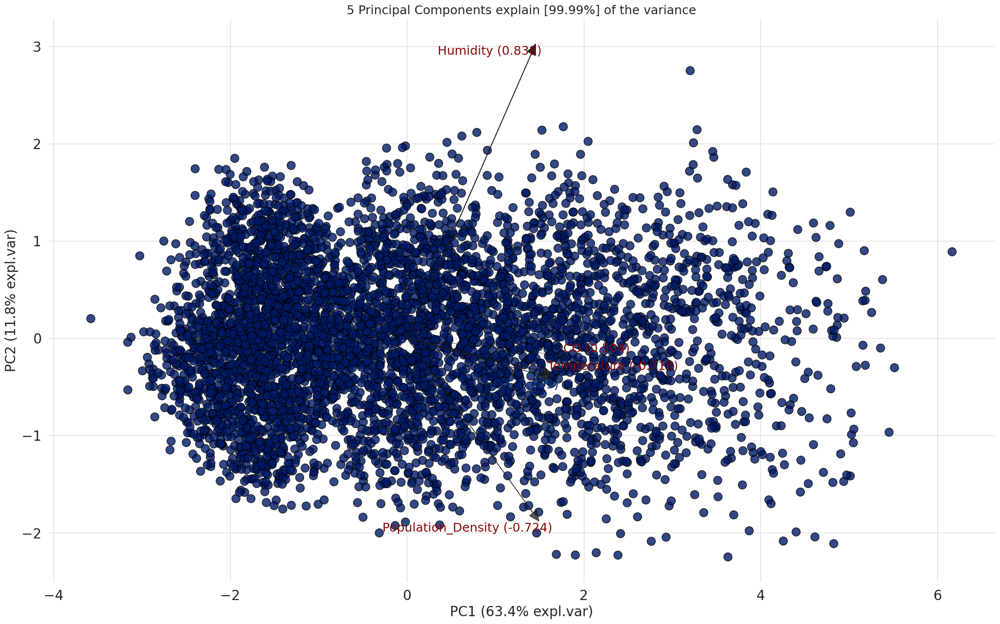

In [ ]:
model.biplot(label=False, legend=False, color_arrow='k')

[scatterd] >INFO> Create scatterplot


[pca] >Plot PC1 vs PC2 vs PC3 with loadings.
[scatterd]> WARNING use the standardized verbose status. The status [1-6] will be deprecated in future versions.


(<Figure size 3000x2500 with 1 Axes>,
 <Axes3D: title={'center': '5 Principal Components explain [99.99%] of the variance'}, xlabel='PC1 (63.4% expl.var)', ylabel='PC2 (11.8% expl.var)', zlabel='PC3 (10.9% expl.var)'>)

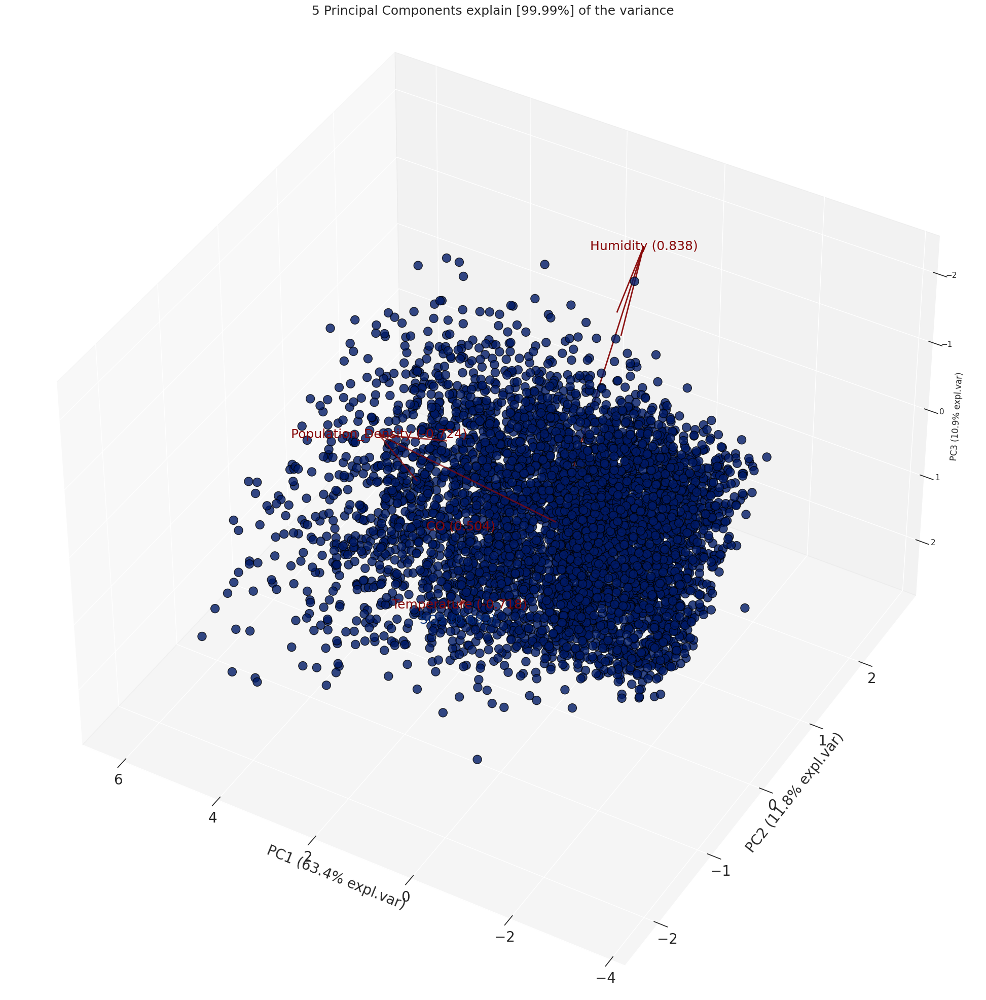

In [ ]:
model.biplot3d(legend=False)

# Classification using Pycaret
At first dataset is split into train and test set with 70% and 30% ratio respectively. Then using the PyCaret compare_models() function, the models which shows the highest accuracy on the original dataset can be found.
Before applying PCA, the output from compare_models() function shows that Linear Discriminant Analayis, Extra Trees Classifier, and Gradient Boosting Classifier shows the best performance.

 However, after applying PCA, the these models performance decreases and Logistic Regression, K-nearest neighbour, and Quadratic Discriminant Analysis shows the highest performance. Therefore, I have taken Logistic Regression, K-nearest Neighbour and Quadratic discriminant Analysis as my classification algorithms and applied these three models on the original dataset before applying PCA and after applying PCA.

In [ ]:
#Run the below code in your notebook to check the installed version
from pycaret.utils import version
version()

'3.3.2'

In [ ]:
# #For Google Colab only
# from pycaret.utils import enable_colab
# enable_colab()

In [ ]:
data = df.sample(frac=0.8, random_state=786)
data_unseen = df.drop(data.index)
#dr = df.drop(columns=['id'])

data.reset_index(drop=True, inplace=True)
data_unseen.reset_index(drop=True, inplace=True)

print('Data for Modeling: ' + str(data.shape))
print('Unseen Data For Predictions: ' + str(data_unseen.shape))

Data for Modeling: (4000, 6)
Unseen Data For Predictions: (1000, 6)


In [ ]:
data

,Temperature,Humidity,SO2,CO,Population_Density,Air Quality
0,25.6,57.4,5.0,1.19,392,Good
1,25.8,42.2,9.0,0.99,543,Good
2,29.0,67.2,6.5,0.84,524,Good
3,19.1,46.7,6.6,0.88,395,Good
4,30.6,58.5,9.3,1.54,405,Moderate
...,...,...,...,...,...,...
3995,24.2,46.4,3.6,1.04,365,Good
3996,21.9,58.3,7.3,0.90,493,Good
3997,31.0,72.1,5.9,1.70,332,Moderate
3998,23.2,73.9,4.2,0.98,494,Good


In [ ]:
from pycaret.classification import *
clf = setup(data=data, target='Air Quality', train_size=0.7, session_id=123)

,Description,Value
0,Session id,123
1,Target,Air Quality
2,Target type,Multiclass
3,Target mapping,"Good: 0, Moderate: 1, Poor: 2"
4,Original data shape,"(4000, 6)"
5,Transformed data shape,"(4000, 6)"
6,Transformed train set shape,"(2800, 6)"
7,Transformed test set shape,"(1200, 6)"
8,Numeric features,5
9,Preprocess,True


**Comparing All Models**

In [ ]:
#show the best model and their statistics
best_model = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
qda,Quadratic Discriminant Analysis,0.9518,0.0000,0.9518,0.9523,0.9517,0.9270,0.9274,0.0360
nb,Naive Bayes,0.9496,0.9938,0.9496,0.9510,0.9495,0.9238,0.9245,0.0640
et,Extra Trees Classifier,0.9486,0.9932,0.9486,0.9493,0.9485,0.9222,0.9225,0.4040
gbc,Gradient Boosting Classifier,0.9468,0.0000,0.9468,0.9472,0.9467,0.9195,0.9197,1.0990
xgboost,Extreme Gradient Boosting,0.9429,0.9914,0.9429,0.9432,0.9428,0.9135,0.9138,0.2390
lightgbm,Light Gradient Boosting Machine,0.9425,0.9919,0.9425,0.9429,0.9424,0.9130,0.9132,1.0530
rf,Random Forest Classifier,0.9404,0.9922,0.9404,0.9405,0.9403,0.9097,0.9099,0.4310
lr,Logistic Regression,0.9389,0.0000,0.9389,0.9396,0.9387,0.9075,0.9080,1.2800
lda,Linear Discriminant Analysis,0.9246,0.0000,0.9246,0.9287,0.9242,0.8857,0.8878,0.0380
dt,Decision Tree Classifier,0.9136,0.9369,0.9136,0.9138,0.9134,0.8692,0.8695,0.0450


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

In [ ]:
best_model

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

 Create a Model

**Logistic Regresssion**

In [ ]:
lr = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9571,0.0000,0.9571,0.9570,0.9569,0.9350,0.9352
1,0.9250,0.0000,0.9250,0.9263,0.9244,0.8861,0.8872
2,0.9500,0.0000,0.9500,0.9500,0.9497,0.9243,0.9245
3,0.9536,0.0000,0.9536,0.9535,0.9534,0.9298,0.9299
4,0.9429,0.0000,0.9429,0.9425,0.9425,0.9135,0.9136
5,0.9321,0.0000,0.9321,0.9317,0.9315,0.8971,0.8975
6,0.9357,0.0000,0.9357,0.9367,0.9358,0.9027,0.9031
7,0.9143,0.0000,0.9143,0.9188,0.9147,0.8704,0.8721
8,0.9286,0.0000,0.9286,0.9300,0.9287,0.8918,0.8924


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune the model**

In [ ]:
tuned_lr=tune_model(lr)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9607,0.0000,0.9607,0.9611,0.9606,0.9405,0.9407
1,0.9393,0.0000,0.9393,0.9406,0.9390,0.9080,0.9088
2,0.9429,0.0000,0.9429,0.9427,0.9426,0.9135,0.9136
3,0.9571,0.0000,0.9571,0.9573,0.9570,0.9352,0.9354
4,0.9500,0.0000,0.9500,0.9516,0.9503,0.9245,0.9250
5,0.9214,0.0000,0.9214,0.9226,0.9217,0.8814,0.8817
6,0.9321,0.0000,0.9321,0.9323,0.9321,0.8973,0.8974
7,0.9321,0.0000,0.9321,0.9387,0.9329,0.8975,0.9000
8,0.9214,0.0000,0.9214,0.9227,0.9217,0.8811,0.8814


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_lr

LogisticRegression(C=9.984, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

**Evaluate Logistic Regression**


In [ ]:
evaluate_model(tuned_lr)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with K-nearest neighbour**

In [ ]:
knn = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8071,0.9219,0.8071,0.8034,0.8009,0.7051,0.7096
1,0.8179,0.9226,0.8179,0.8179,0.8155,0.7223,0.7245
2,0.8500,0.9490,0.8500,0.8500,0.8478,0.7717,0.7739
3,0.8286,0.9406,0.8286,0.8369,0.8269,0.7384,0.7435
4,0.8000,0.9160,0.8000,0.7988,0.7957,0.6948,0.6986
5,0.7964,0.9116,0.7964,0.7972,0.7930,0.6896,0.6930
6,0.7607,0.9225,0.7607,0.7646,0.7573,0.6345,0.6391
7,0.8036,0.9123,0.8036,0.8085,0.8041,0.7020,0.7035
8,0.8286,0.9342,0.8286,0.8306,0.8264,0.7383,0.7415


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune model with K-nearest neighbour**

In [ ]:
tuned_knn = tune_model(knn)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8393,0.9492,0.8393,0.8412,0.8372,0.7550,0.7577
1,0.8071,0.9399,0.8071,0.8094,0.8041,0.7055,0.7091
2,0.8500,0.9568,0.8500,0.8477,0.8472,0.7719,0.7735
3,0.8464,0.9499,0.8464,0.8513,0.8445,0.7659,0.7698
4,0.7929,0.9332,0.7929,0.7940,0.7902,0.6842,0.6872
5,0.8214,0.9433,0.8214,0.8249,0.8190,0.7284,0.7317
6,0.7750,0.9382,0.7750,0.7817,0.7734,0.6566,0.6607
7,0.8036,0.9268,0.8036,0.8050,0.8019,0.7013,0.7033
8,0.8321,0.9473,0.8321,0.8368,0.8309,0.7440,0.7471


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_knn

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='manhattan',
                     metric_params=None, n_jobs=-1, n_neighbors=13, p=2,
                     weights='distance')

**Evaluate model with K-nearest neighbour**

In [ ]:
evaluate_model(tuned_knn)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

**Create model with Quadratic Discriminant Analysis**

In [ ]:
qda=create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9571,0.0000,0.9571,0.9578,0.9570,0.9351,0.9355
1,0.9393,0.0000,0.9393,0.9396,0.9389,0.9079,0.9084
2,0.9500,0.0000,0.9500,0.9496,0.9496,0.9243,0.9245
3,0.9643,0.0000,0.9643,0.9642,0.9642,0.9460,0.9460
4,0.9571,0.0000,0.9571,0.9573,0.9571,0.9352,0.9353
5,0.9500,0.0000,0.9500,0.9496,0.9497,0.9243,0.9244
6,0.9500,0.0000,0.9500,0.9508,0.9498,0.9243,0.9248
7,0.9393,0.0000,0.9393,0.9414,0.9395,0.9082,0.9090
8,0.9464,0.0000,0.9464,0.9473,0.9465,0.9188,0.9192


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

**Tune QDA Model**

In [ ]:
tuned_qda=tune_model(qda)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9143,0.0000,0.9143,0.9139,0.9132,0.8697,0.8706
1,0.8964,0.0000,0.8964,0.9012,0.8968,0.8430,0.8447
2,0.9000,0.0000,0.9000,0.8989,0.8990,0.8486,0.8490
3,0.9143,0.0000,0.9143,0.9130,0.9129,0.8700,0.8707
4,0.9036,0.0000,0.9036,0.9028,0.9024,0.8536,0.8545
5,0.8679,0.0000,0.8679,0.8702,0.8687,0.8003,0.8006
6,0.8964,0.0000,0.8964,0.8976,0.8962,0.8429,0.8436
7,0.9107,0.0000,0.9107,0.9130,0.9114,0.8651,0.8656
8,0.8929,0.0000,0.8929,0.8947,0.8923,0.8374,0.8386


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


**Evaluate QDA Model**

In [ ]:
tuned_qda

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [ ]:
evaluate_model(tuned_qda)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
!pip install statsmodels --upgrade

# **Classification + PCA**

In [ ]:
clf_pca = setup(data=data, target='Air Quality', train_size=0.7, session_id=123, normalize = True, pca = True, pca_components = 3)

,Description,Value
0,Session id,123
1,Target,Air Quality
2,Target type,Multiclass
3,Target mapping,"Good: 0, Moderate: 1, Poor: 2"
4,Original data shape,"(4000, 6)"
5,Transformed data shape,"(4000, 4)"
6,Transformed train set shape,"(2800, 4)"
7,Transformed test set shape,"(1200, 4)"
8,Numeric features,5
9,Preprocess,True


# **Comparing Models**

In [ ]:
#show the best model and their statistics
best_model_pca = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
knn,K Neighbors Classifier,0.9146,0.9762,0.9146,0.9151,0.9143,0.8707,0.8712,0.1910
rf,Random Forest Classifier,0.9136,0.9816,0.9136,0.9141,0.9135,0.8691,0.8695,0.7900
et,Extra Trees Classifier,0.9125,0.9819,0.9125,0.9130,0.9122,0.8675,0.8680,0.5650
lightgbm,Light Gradient Boosting Machine,0.9118,0.9832,0.9118,0.9124,0.9117,0.8665,0.8668,1.9600
gbc,Gradient Boosting Classifier,0.9107,0.0000,0.9107,0.9113,0.9105,0.8648,0.8653,2.3770
qda,Quadratic Discriminant Analysis,0.9100,0.0000,0.9100,0.9113,0.9098,0.8636,0.8645,0.0870
xgboost,Extreme Gradient Boosting,0.9100,0.9825,0.9100,0.9108,0.9100,0.8638,0.8642,0.3090
lr,Logistic Regression,0.9089,0.0000,0.9089,0.9097,0.9087,0.8621,0.8627,0.1290
lda,Linear Discriminant Analysis,0.8971,0.0000,0.8971,0.9015,0.8966,0.8438,0.8461,0.0750
nb,Naive Bayes,0.8954,0.9787,0.8954,0.8978,0.8955,0.8415,0.8424,0.1600


Processing:   0%|          | 0/65 [00:00<?, ?it/s]

# **Best model with PCA**

In [ ]:
best_model_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=-1, n_neighbors=5, p=2,
                     weights='uniform')

# **Tune Best Model**

In [ ]:
# Tune hyperparameters with scikit-learn (default)
tuned_best_model_pca = tune_model(best_model_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9321,0.9844,0.9321,0.9343,0.9320,0.8971,0.8981
1,0.9179,0.9892,0.9179,0.9193,0.9178,0.8755,0.8762
2,0.9321,0.9872,0.9321,0.9318,0.9316,0.8973,0.8976
3,0.9214,0.9835,0.9214,0.9206,0.9204,0.8808,0.8814
4,0.9214,0.9768,0.9214,0.9206,0.9206,0.8809,0.8813
5,0.9000,0.9697,0.9000,0.9012,0.9003,0.8488,0.8491
6,0.9250,0.9868,0.9250,0.9259,0.9251,0.8865,0.8868
7,0.9000,0.9738,0.9000,0.9047,0.9009,0.8489,0.8503
8,0.9107,0.9853,0.9107,0.9113,0.9105,0.8647,0.8651


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


# **Evaluate Best Model**

In [ ]:
evaluate_model(tuned_best_model_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

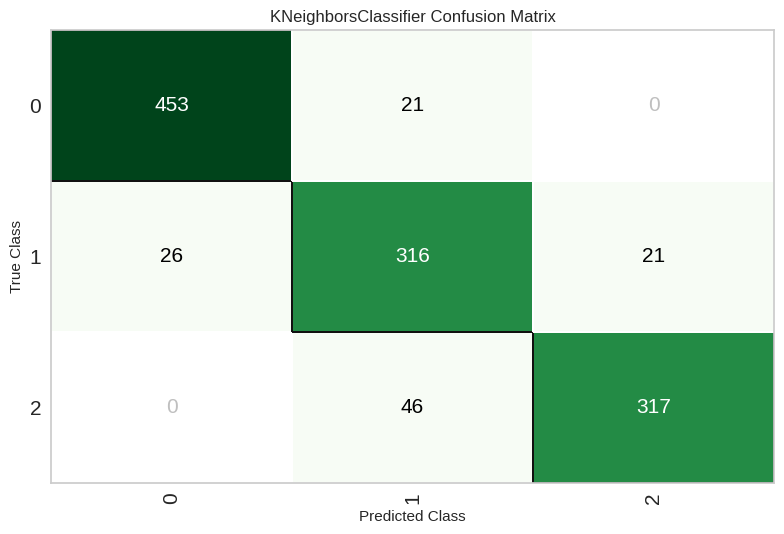

In [ ]:
plot_model(tuned_best_model_pca, plot='confusion_matrix')

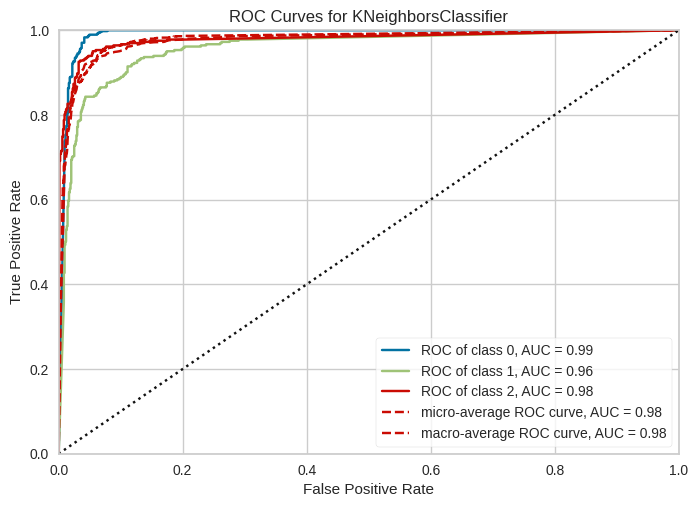

In [ ]:
plot_model(tuned_best_model_pca, plot = 'auc')

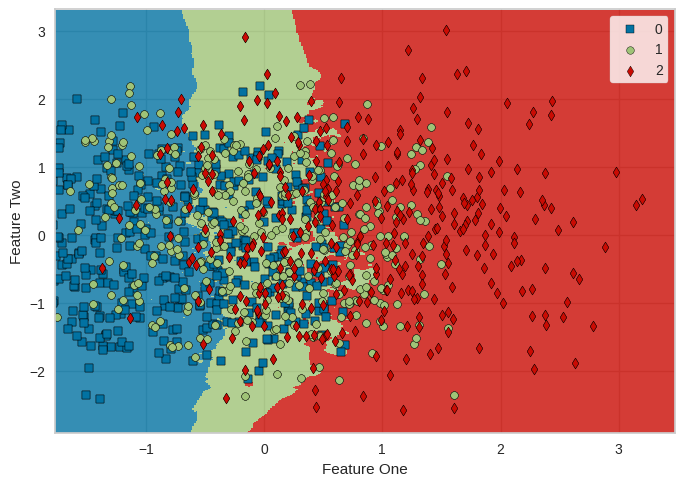

In [ ]:
plot_model(tuned_best_model_pca, plot='boundary')

In [ ]:
lr_pca = create_model('lr')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9286,0.0000,0.9286,0.9282,0.9282,0.8917,0.8919
1,0.9143,0.0000,0.9143,0.9163,0.9145,0.8702,0.8709
2,0.9143,0.0000,0.9143,0.9136,0.9137,0.8703,0.8705
3,0.9107,0.0000,0.9107,0.9094,0.9093,0.8646,0.8653
4,0.9214,0.0000,0.9214,0.9206,0.9204,0.8808,0.8814
5,0.9036,0.0000,0.9036,0.9037,0.9036,0.8541,0.8542
6,0.9071,0.0000,0.9071,0.9098,0.9079,0.8597,0.8602
7,0.8821,0.0000,0.8821,0.8881,0.8835,0.8221,0.8236
8,0.9036,0.0000,0.9036,0.9050,0.9037,0.8540,0.8545


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Model**

In [ ]:
tuned_lr_pca = tune_model(lr_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9286,0.0000,0.9286,0.9288,0.9285,0.8918,0.8919
1,0.9107,0.0000,0.9107,0.9134,0.9112,0.8648,0.8657
2,0.9179,0.0000,0.9179,0.9174,0.9175,0.8757,0.8759
3,0.9107,0.0000,0.9107,0.9094,0.9093,0.8646,0.8653
4,0.9214,0.0000,0.9214,0.9203,0.9204,0.8809,0.8813
5,0.9000,0.0000,0.9000,0.9016,0.9006,0.8489,0.8491
6,0.9036,0.0000,0.9036,0.9069,0.9045,0.8543,0.8550
7,0.8857,0.0000,0.8857,0.8924,0.8872,0.8275,0.8293
8,0.9071,0.0000,0.9071,0.9081,0.9073,0.8594,0.8597


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


# **Evaluate Model**

In [ ]:
tuned_lr_pca

LogisticRegression(C=2.833, class_weight='balanced', dual=False,
                   fit_intercept=True, intercept_scaling=1, l1_ratio=None,
                   max_iter=1000, multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=123, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [ ]:
evaluate_model(tuned_lr_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

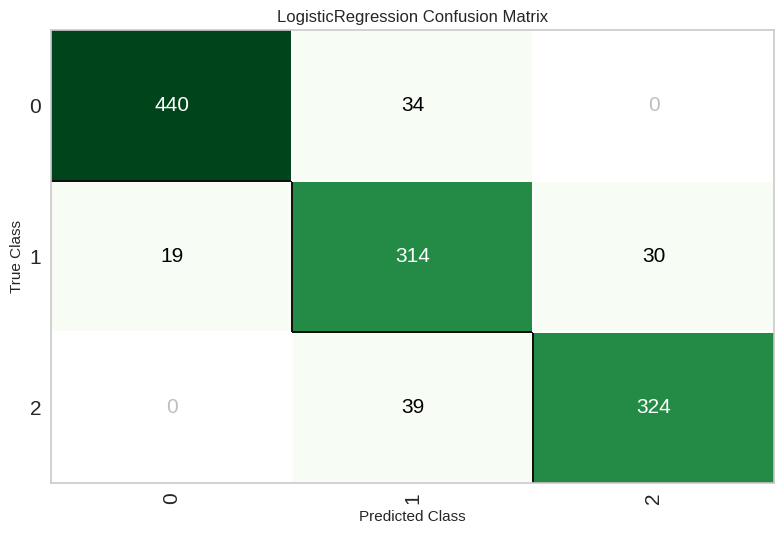

In [ ]:
plot_model(tuned_lr_pca, plot='confusion_matrix')

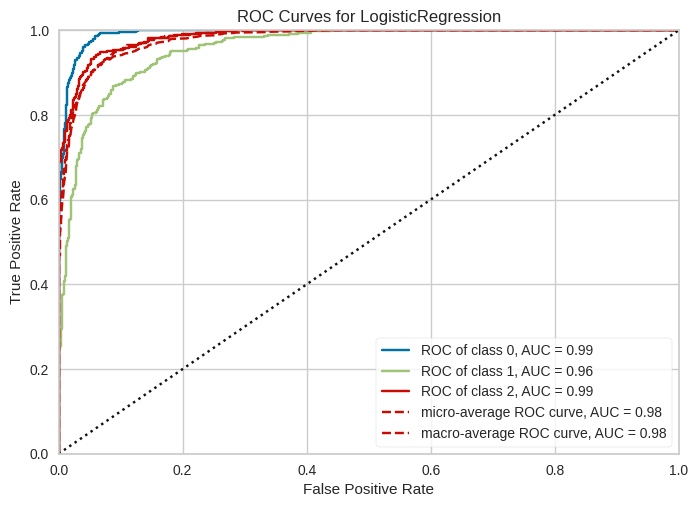

In [ ]:
plot_model(tuned_lr_pca, plot = 'auc')

# **Create K-nearest neighbour Model**

In [ ]:
knn_pca = create_model('knn')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9286,0.9782,0.9286,0.9290,0.9283,0.8917,0.8921
1,0.9071,0.9827,0.9071,0.9072,0.9068,0.8592,0.8595
2,0.9393,0.9809,0.9393,0.9392,0.9391,0.9082,0.9084
3,0.9179,0.9756,0.9179,0.9172,0.9170,0.8754,0.8760
4,0.9179,0.9709,0.9179,0.9167,0.9169,0.8754,0.8759
5,0.9000,0.9648,0.9000,0.9012,0.9003,0.8488,0.8491
6,0.9143,0.9788,0.9143,0.9156,0.9142,0.8701,0.8707
7,0.8964,0.9649,0.8964,0.9006,0.8972,0.8435,0.8447
8,0.9071,0.9866,0.9071,0.9057,0.9061,0.8591,0.8594


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune Model**

In [ ]:
tuned_knn_pca = tune_model(knn_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9321,0.9844,0.9321,0.9343,0.9320,0.8971,0.8981
1,0.9179,0.9892,0.9179,0.9193,0.9178,0.8755,0.8762
2,0.9321,0.9872,0.9321,0.9318,0.9316,0.8973,0.8976
3,0.9214,0.9835,0.9214,0.9206,0.9204,0.8808,0.8814
4,0.9214,0.9768,0.9214,0.9206,0.9206,0.8809,0.8813
5,0.9000,0.9697,0.9000,0.9012,0.9003,0.8488,0.8491
6,0.9250,0.9868,0.9250,0.9259,0.9251,0.8865,0.8868
7,0.9000,0.9738,0.9000,0.9047,0.9009,0.8489,0.8503
8,0.9107,0.9853,0.9107,0.9113,0.9105,0.8647,0.8651


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


In [ ]:
tuned_knn_pca

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='euclidean',
                     metric_params=None, n_jobs=-1, n_neighbors=12, p=2,
                     weights='distance')

# **Evaluate Model KNN**

In [ ]:
evaluate_model(tuned_knn_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

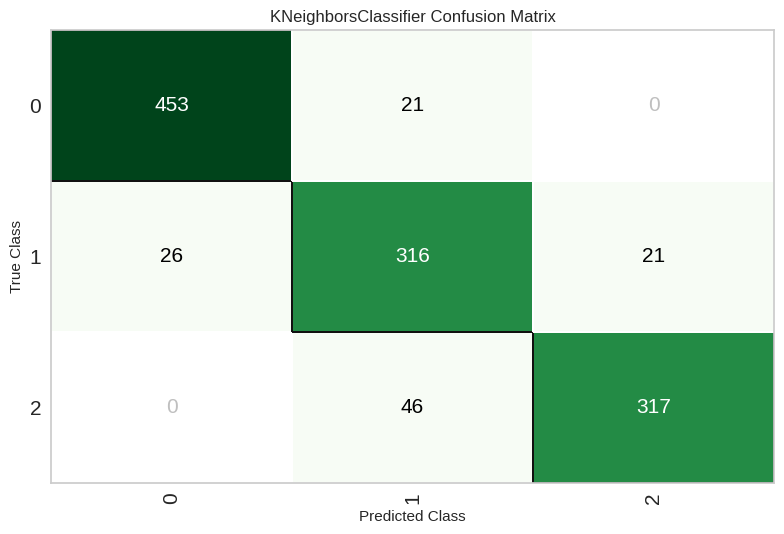

In [ ]:
plot_model(tuned_knn_pca, plot='confusion_matrix')

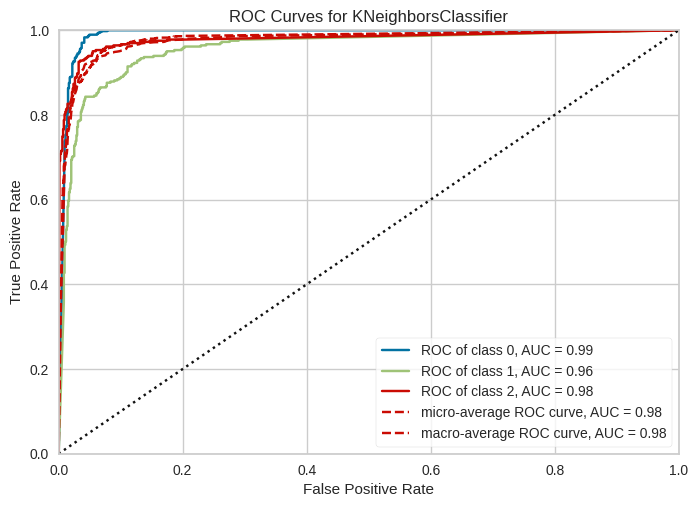

In [ ]:
plot_model(tuned_knn_pca, plot = 'auc')

# **Create Quadratic Discriminant Analysis Model**

In [ ]:
qda_pca = create_model('qda')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9214,0.0000,0.9214,0.9208,0.9207,0.8808,0.8812
1,0.9179,0.0000,0.9179,0.9197,0.9180,0.8755,0.8762
2,0.9107,0.0000,0.9107,0.9097,0.9098,0.8647,0.8651
3,0.9179,0.0000,0.9179,0.9167,0.9167,0.8754,0.8760
4,0.9107,0.0000,0.9107,0.9105,0.9096,0.8645,0.8654
5,0.9000,0.0000,0.9000,0.9004,0.9000,0.8486,0.8488
6,0.9036,0.0000,0.9036,0.9073,0.9043,0.8541,0.8551
7,0.9000,0.0000,0.9000,0.9067,0.9011,0.8489,0.8510
8,0.9071,0.0000,0.9071,0.9104,0.9074,0.8594,0.8606


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

# **Tune model**

In [ ]:
tuned_qda_pca = tune_model(qda_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9179,0.0000,0.9179,0.9183,0.9171,0.8752,0.8762
1,0.9143,0.0000,0.9143,0.9164,0.9135,0.8698,0.8714
2,0.9179,0.0000,0.9179,0.9171,0.9170,0.8754,0.8759
3,0.9036,0.0000,0.9036,0.9024,0.9022,0.8536,0.8545
4,0.9071,0.0000,0.9071,0.9079,0.9061,0.8590,0.8603
5,0.9036,0.0000,0.9036,0.9047,0.9034,0.8539,0.8545
6,0.9036,0.0000,0.9036,0.9057,0.9037,0.8538,0.8547
7,0.9107,0.0000,0.9107,0.9184,0.9114,0.8650,0.8678
8,0.8964,0.0000,0.8964,0.9000,0.8961,0.8427,0.8445


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


# **Evaluate Model**

In [ ]:
tuned_qda_pca

QuadraticDiscriminantAnalysis(priors=None, reg_param=0.0,
                              store_covariance=False, tol=0.0001)

In [ ]:
evaluate_model(tuned_qda_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

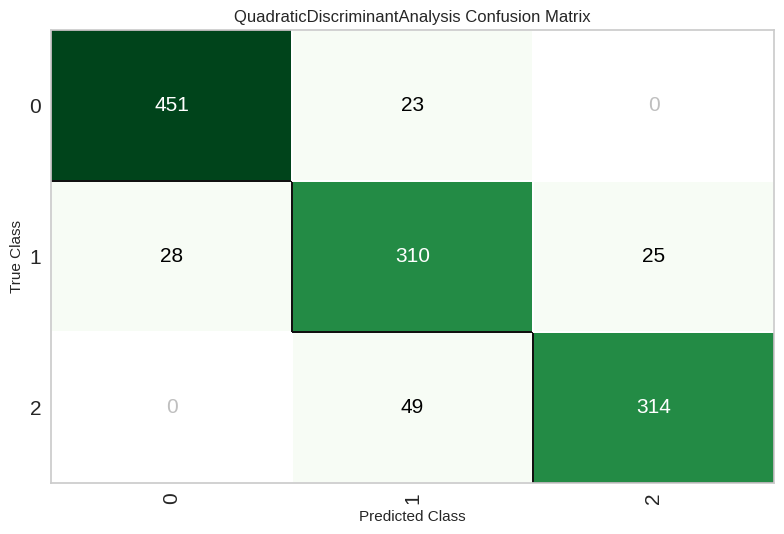

In [ ]:
plot_model(tuned_qda_pca, plot='confusion_matrix')

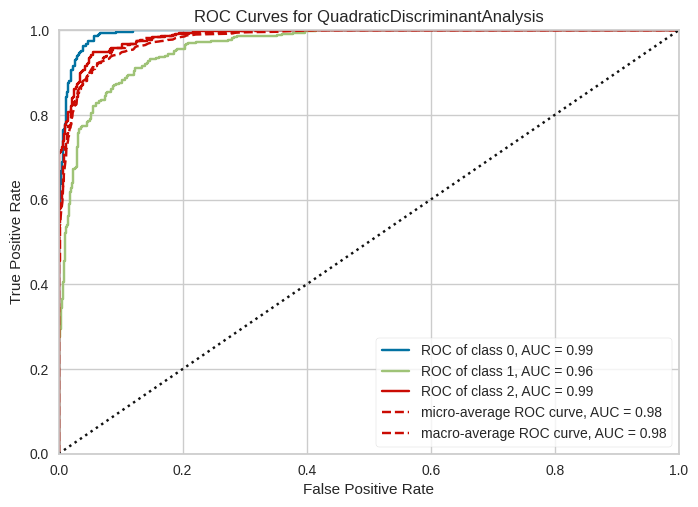

In [ ]:
plot_model(tuned_qda_pca, plot = 'auc')

# Explainable AI with Shapley values
For binary classification, AI shapley can only support tree based classification models. I chose "random forest classifier" for the AI Shapley analysis.

In [ ]:
rf_pca = create_model('rf')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9214,0.9840,0.9214,0.9206,0.9208,0.8808,0.8810
1,0.9214,0.9867,0.9214,0.9217,0.9215,0.8810,0.8811
2,0.9357,0.9888,0.9357,0.9353,0.9353,0.9027,0.9029
3,0.9071,0.9832,0.9071,0.9060,0.9064,0.8593,0.8595
4,0.9250,0.9764,0.9250,0.9246,0.9245,0.8863,0.8867
5,0.9000,0.9771,0.9000,0.9003,0.9000,0.8487,0.8488
6,0.8929,0.9787,0.8929,0.8972,0.8940,0.8381,0.8390
7,0.8964,0.9729,0.8964,0.8995,0.8973,0.8435,0.8442
8,0.9071,0.9842,0.9071,0.9064,0.9067,0.8593,0.8594


Processing:   0%|          | 0/4 [00:00<?, ?it/s]

In [ ]:
tuned_rf_pca = tune_model(rf_pca)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.8964,0.9761,0.8964,0.8958,0.8953,0.8426,0.8434
1,0.9321,0.9868,0.9321,0.9357,0.9326,0.8973,0.8986
2,0.9250,0.9847,0.9250,0.9251,0.9250,0.8865,0.8866
3,0.9143,0.9849,0.9143,0.9136,0.9135,0.8700,0.8705
4,0.9071,0.9646,0.9071,0.9125,0.9079,0.8596,0.8613
5,0.9107,0.9765,0.9107,0.9120,0.9106,0.8649,0.8655
6,0.8857,0.9666,0.8857,0.8919,0.8866,0.8269,0.8287
7,0.8821,0.9687,0.8821,0.8884,0.8828,0.8217,0.8238
8,0.8964,0.9723,0.8964,0.9013,0.8974,0.8433,0.8446


Processing:   0%|          | 0/7 [00:00<?, ?it/s]

Fitting 10 folds for each of 10 candidates, totalling 100 fits


Original model was better than the tuned model, hence it will be returned. NOTE: The display metrics are for the tuned model (not the original one).


In [ ]:
tuned_rf_pca

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='sqrt',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_samples_leaf=1,
                       min_samples_split=2, min_weight_fraction_leaf=0.0,
                       monotonic_cst=None, n_estimators=100, n_jobs=-1,
                       oob_score=False, random_state=123, verbose=0,
                       warm_start=False)

In [ ]:
evaluate_model(tuned_rf_pca)

interactive(children=(ToggleButtons(description='Plot Type:', icons=('',), options=(('Pipeline Plot', 'pipelin…

In [ ]:
!pip install shap

In [ ]:
import shap

<Figure size 800x550 with 0 Axes>

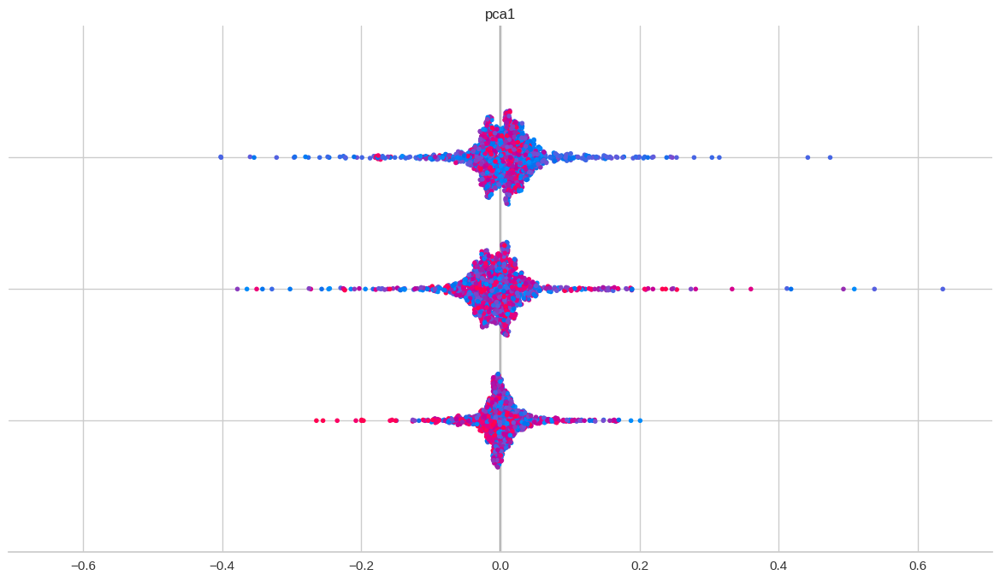

In [ ]:
interpret_model(tuned_rf_pca, plot='summary')

In [ ]:
plt.figure()
interpret_model(tuned_rf_pca, plot='reason', observation=32)
#plt.savefig('reason_plot_obs.png', bbox_inches='tight')

<Figure size 800x550 with 0 Axes>

In [ ]:
plt.figure()
interpret_model(tuned_rf_pca, plot='reason')
#plt.savefig('reason_plot.png', bbox_inches='tight')

<Figure size 800x550 with 0 Axes>

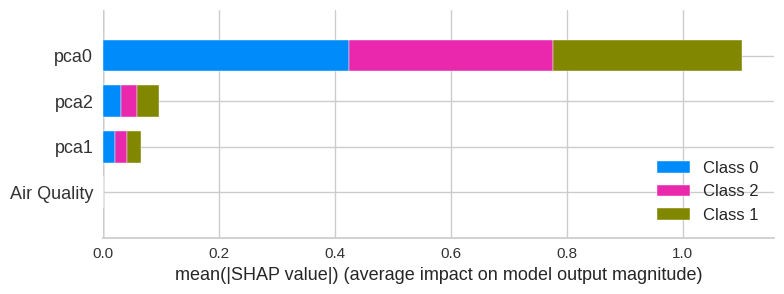

In [ ]:
# Get SHAP values manually if needed
explainer = shap.TreeExplainer(tuned_rf_pca)
X_pca = get_config('test_transformed')  # or X_train

shap_values = explainer.shap_values(X_pca)

# Compute and plot mean absolute SHAP values for PCA components
mean_shap = np.mean(np.abs(shap_values), axis=1)  # if multiclass, shape is (classes, samples, features)

shap.summary_plot(shap_values, X_pca, plot_type='bar')

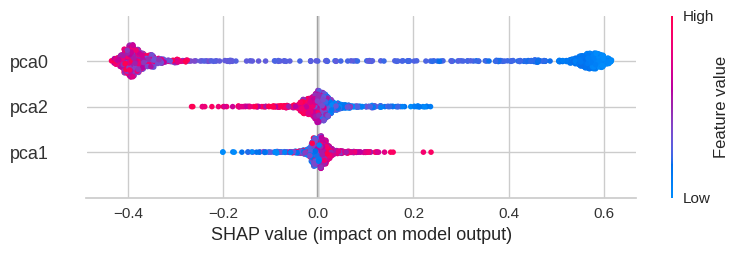

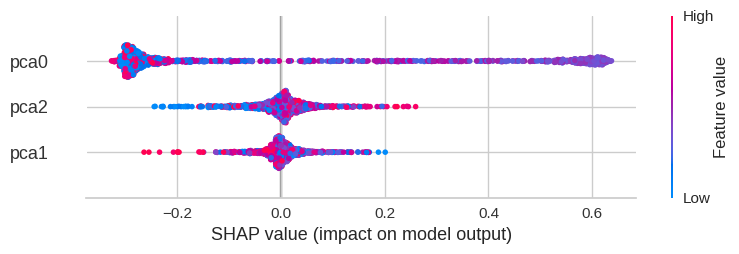

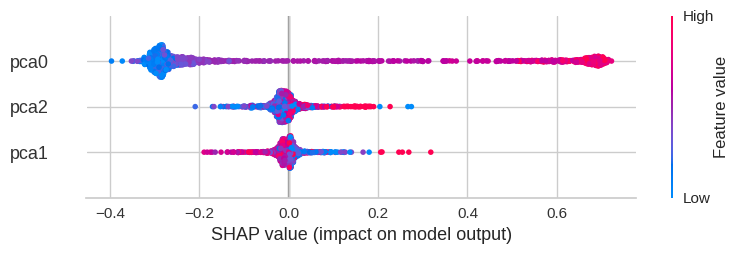

In [ ]:

# Explain the model using SHAP values
#explainer = shap.TreeExplainer(rf_classifier, X_train, check_additivity=False)
explainer = shap.TreeExplainer(tuned_rf_pca)
X_pca = clf_pca.get_config('test_transformed')[['pca0','pca1','pca2']]
shap_values = explainer.shap_values(X_pca, check_additivity=False)

shap_values_class_0 = shap_values[:,:,0]
shap_values_class_1 = shap_values[:,:,1]
shap_values_class_2 = shap_values[:,:,2]

# Plot SHAP summary plot (for feature importance)
shap.summary_plot(shap_values_class_0, X_pca)

shap.summary_plot(shap_values_class_1, X_pca)

shap.summary_plot(shap_values_class_2, X_pca)


plt.show()

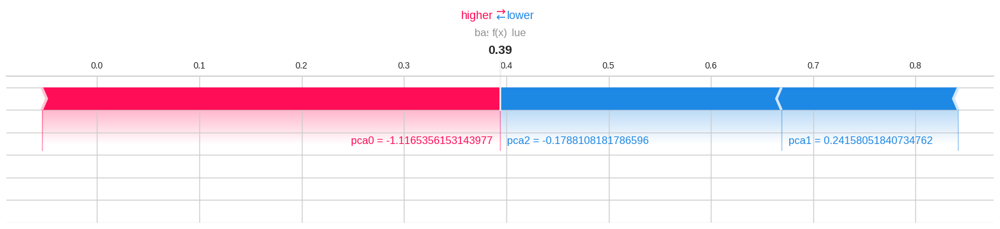

In [ ]:
shap.plots.force(explainer.expected_value[0], shap_values[100][0,:], X_pca.iloc[100, :], matplotlib = True)

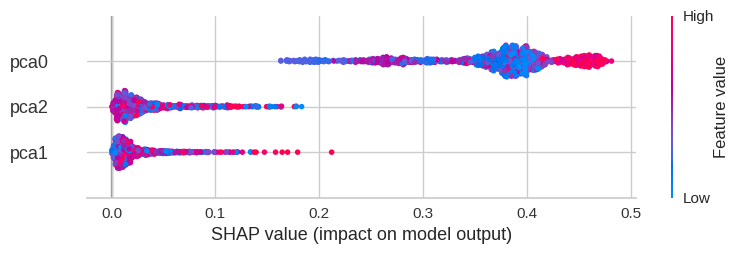

In [ ]:
# Aggregate SHAP values across all classes
shap_values_agg = np.mean(np.abs(shap_values), axis=2)

# Summary plot for the aggregated SHAP values
shap.summary_plot(shap_values_agg, X_pca)

# Visualize feature importance
# shap.summary_plot(shap_values, X_pca)